In [ ]:
%pip install HanTa
%pip install lda
%pip install pyldavis
%pip install germalemma == 0.1.3


In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from sentence_transformers import SentenceTransformer, util
# import lda
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from HanTa import HanoverTagger as ht
from nltk.corpus import stopwords
from germalemma import GermaLemma
from bertopic import BERTopic
import pyLDAvis.gensim_models
import pyLDAvis
from bertopic import BERTopic
pyLDAvis.enable_notebook()

nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('stopwords')
en_tagger = ht.HanoverTagger('morphmodel_en.pgz')
de_tagger = ht.HanoverTagger('morphmodel_ger.pgz')
import seaborn as sns


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Moinam\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Moinam\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Moinam\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Moinam\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# Text Analysis Functions
def run_bert_topic_model(df, method: str ="default", filename: str = "BERTopic_model"):
    """
    Method to run BERTopic model package and fit documents to it.
        :params: 
                 `df (Dataframe)`: tweet dataset dataframe.
                 `method (str)`: Sentence Embedding name to be used. `roberta` or `default`
        :return: 
                 `model (BERTopic model)`: Document fitted BERTopic model object.
                 `topics (Dict)`: Topic matrix.
                 `probabilities (Dict)`: Document topic probabilities matrix.
    """
    if method == "roberta":
        sen_embed_model = SentenceTransformer(
            "T-Systems-onsite/cross-en-de-roberta-sentence-transformer")
        model = BERTopic(embedding_model=sen_embed_model, nr_topics="auto")
    elif method == 'default':
        model = BERTopic(
            verbose=True, language="multilingual", nr_topics="auto")
    docs = df.tweet_without_stopwords.to_list()
    topics, probabilities = model.fit_transform(docs)
    model.reduce_topics(docs, nr_topics=50)
    try:
        model.save(filename)
    except Exception as e:
        print(f"BERTopic model file selected already exists in storage. Unable to save model.\n Error: {e}")
    return model, topics, probabilities


def load_bert_topic_model(filename: str):
    """
    Method to load document fitted exsiting BERTopic model.
        :params: 
                 `filename (str)`: File name of the BERTopic model.
        :return: 
                 `model (BERTopic model)`: Document fitted BERTopic model object.
    """
    try:
        model = BERTopic.load(filename)
    except Exception as e:
        print(f"BERTopic model file not found.\n Error: {e}")
        model = None
    return model


In [3]:
read_df = pd.read_parquet("tweets_analysis_dataset.parquet")

In [4]:
read_df.iloc[read_df[read_df["tweet_id"] == 1405806358335832065].index.values[0]].hashtags

"['Machtmissbrauch', 'Wissenschaft', 'prekär', 'IchbinHanna', 'WissZeitVG', '95vsWissZeitVG']"

In [5]:
read_df.iloc[read_df[read_df["tweet_id"] == 1405806358335832065].index.values[0]].hashtag_topics

array(['95vswisszeitvg', 'wisszeitvg', 'ausbeutung', 'ichbinhanna',
       'bastaprecariatodistato', 'wissenschaftsfreiheit'], dtype=object)

In [6]:
read_df

,timestamp,tweet_id,conversation_id,author_id,text,retweet_count,reply_count,like_count,quote_count,referenced_tweets,hashtags,tweet_type,tweet_language,tweet_without_stopwords,text_topic,hashtag_topics
0,2021-06-20T21:29:24.000Z,1406725899744157698,1406725899744157698,2981738470,Wenn Wirtschaftsjounalistinnen über schreiben...,9,1,62,4,[],['IchbinHanna'],original,de,Wenn Wirtschaftsjounalistinnen schreiben amp D...,-1_ich_amp_das_die,[ichbinhanna]
1,2021-06-20T16:17:25.000Z,1406647386542325764,1406647386542325764,2981738470,,0,0,1,0,"[{'type': 'quoted', 'id': '1406620276822061057'}]","['IchbinHanna', 'PeerReview']",original,nl,,0_wisszeitvg_ich_das_die,[ichbinhanna]
2,2021-06-18T13:10:36.000Z,1405875593711964166,1405875593711964166,1132055796571877376,Thread about the cruel in German The debate...,5,0,19,0,"[{'type': 'quoted', 'id': '1405846267759054851'}]","['precarity', 'academia', 'IchbinHanna', 'Acad...",original,en,Thread cruel German The debate started days ag...,1_deutschland_german_germany_deutschen,"[academia, wisszeitvg, ichbinhanna, academictw..."
3,2021-06-18T10:21:31.000Z,1405833045224087555,1405833045224087555,242424959,Liebe und Forsa schön dass ihr euch per Umfr...,0,1,2,0,[],"['Mittelbau', 'IchBinHanna']",original,de,Liebe Forsa schön per Umfrage interessiert Die...,0_wisszeitvg_ich_das_die,"[dauerstellen, ichbinhanna]"
4,2021-06-18T08:35:29.000Z,1405806358335832065,1405806358335832065,1132055796571877376,Wichtiger Thread zu in der der durch die A...,2,0,13,0,"[{'type': 'quoted', 'id': '1405494574533984264'}]","['Machtmissbrauch', 'Wissenschaft', 'prekär', ...",original,de,Wichtiger Thread Arbeitsverträge begünstigt,0_wisszeitvg_ich_das_die,"[95vswisszeitvg, wisszeitvg, ausbeutung, ichbi..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50901,2021-09-17T14:36:31.000Z,1438874511605125123,1438766234489794560,743696568939753475,I still cant get over how they titled their ...,0,1,0,0,"[{'type': 'replied_to', 'id': '143887433770928...",[],original,en,I still cant get titled youngins Juniorprofess...,12_sws_schweiz_lehre_sachsen,[]
50902,2021-08-25T04:56:31.000Z,1430393629651177473,1430093188757401618,1134768684315160577,WissZeitVG Maximaldauer erreicht\n\nEinfach u...,0,0,0,0,"[{'type': 'replied_to', 'id': '143009318875740...",[],original,de,WissZeitVG Maximaldauer erreicht Einfach unfas...,0_wisszeitvg_ich_das_die,[]
50903,2022-08-13T13:39:47.000Z,1558448232631762944,1558448232631762944,329984940,fellow profs is OUR problem \nSee this collec...,2,0,4,0,"[{'type': 'quoted', 'id': '1556700609155317761'}]",['academicprecarity'],original,en,fellow profs OUR problem See collection info r...,-1_ich_amp_das_die,[academia]
50904,2021-09-02T19:41:11.000Z,1433515364932067338,1433515364932067338,3005636663,beschließt neues Gesetz zur Stärkung der Berl...,1,0,6,0,[],"['Wissenschaft', 'Postdocs', 'Promotionsrecht'...",original,de,beschließt neues Gesetz Stärkung Berliner Daue...,1_deutschland_german_germany_deutschen,"[waspostdocswollen, hochschulen, wissenschafts..."


In [7]:
# Text Analysis BERTopic pipeline
def run_bert(df, model_name: str ="BERTopic_model", choice: str= "train", embed: str ="default"):
    """
    Method to run BERTopic topic modeling pipeline.
        :params: 
                 `df (Dataframe)`: tweet dataset dataframe.
                 `choice (str)`: Train or load BERTopic model. `train` or `load`
                 `model_name (str)`: File name of the BERTopic model to be loaded or saved as after training.
                 `embed (str)`: Sentence Embedding name to be used. `roberta` or `default`
        :return: 
                 `model (BERTopic model)`: Document fitted BERTopic model object.
                 `topics (Dict)`: Topic matrix.
                 `probabilities (Dict)`: Document topic probabilities matrix.
    """
    model = topics = probabilities = None
    if choice == "load":
        model = load_bert_topic_model(model_name)
    elif choice == 'train':
        model, topics, probabilities = run_bert_topic_model(df, method=embed)

    return model, topics, probabilities


In [8]:
bert_50, topics_50, prob_50 = run_bert(read_df, "BERTopic_50", "load", "default")
bert_roberta_50, topics_roberta_50, prob_roberta_50 = run_bert(read_df, "BERTopic_Roberta_50",  "load", "default")


In [14]:
bert_50.visualize_heatmap()

c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [15]:
bert_roberta_50.visualize_heatmap()


c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [16]:
bert_50.visualize_topics()


c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [19]:
bert_roberta_50.visualize_topics()


c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [9]:
docs = read_df.tweet_without_stopwords.to_list()

In [21]:
bert_50.visualize_documents(docs)


c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [22]:
bert_roberta_50.visualize_documents(docs)


c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [23]:
print(bert_50.get_topic_tree(bert_50.hierarchical_topics(docs)))


100%|██████████| 48/48 [00:00<00:00, 109.60it/s]

.
├─ich_die_amp_das_wissenschaft
│    ├─■──wettbewerb_glücksspiel_konkurrenz_vs_besten ── Topic: 24
│    └─ich_die_amp_das_wissenschaft
│         ├─ich_die_amp_das_wissenschaft
│         │    ├─■──journalismus_medien_news_journalistinnen_journalisten ── Topic: 14
│         │    └─ich_die_amp_das_wissenschaft
│         │         ├─ich_die_amp_das_wissenschaft
│         │         │    ├─■──gewerkschaften_gewerkschaft_arbeitslosigkeit_überstunden_arbeitszeit ── Topic: 10
│         │         │    └─ich_die_amp_das_wissenschaft
│         │         │         ├─ich_die_amp_wissenschaft_das
│         │         │         │    ├─ich_wissenschaft_die_hanna_das
│         │         │         │    │    ├─■──vertrag_verträge_contracts_contract_monate ── Topic: 8
│         │         │         │    │    └─ich_wissenschaft_hanna_die_amp
│         │         │         │    │         ├─hanna_ich_wissenschaft_die_das
│         │         │         │    │         │    ├─■──professur_professorinnen_ministerin_

In [24]:
print(bert_roberta_50.get_topic_tree(bert_roberta_50.hierarchical_topics(docs)))


100%|██████████| 48/48 [00:00<00:00, 140.69it/s]

.
├─wissenschaft_amp_ich_hanna_deutschland
│    ├─■──sws_schweiz_lehre_sachsen_switzerland ── Topic: 12
│    └─wissenschaft_amp_hanna_ich_deutschland
│         ├─wissenschaft_amp_deutschland_german_ich
│         │    ├─twitter_tweets_debatte_tweet_interview
│         │    │    ├─■──twitter_tweets_tweet_hashtag_mal ── Topic: 6
│         │    │    └─■──debatte_interview_diskussion_argumente_podiumsdiskussion ── Topic: 9
│         │    └─wissenschaft_amp_deutschland_german_das
│         │         ├─wissenschaft_amp_deutschland_german_germany
│         │         │    ├─wissenschaft_amp_das_ich_die
│         │         │    │    ├─■──amp_alg_karliczek_september_herbst ── Topic: 4
│         │         │    │    └─wissenschaft_das_wisszeitvg_ich_die
│         │         │    │         ├─■──wisszeitvg_ich_das_die_ja ── Topic: 0
│         │         │    │         └─■──wissenschaft_wissenschaftlerinnen_arbeitsbedingungen_wissenschaftssystem_das ── Topic: 2
│         │         │    └─deutschland_ger

In [20]:
topic_info_bert_50 = bert_50.get_topic_info()

topic_info_bert_roberta_50 = bert_roberta_50.get_topic_info()


In [26]:
timestamps = read_df.timestamp.to_list()
topics_over_time = bert_roberta_50.topics_over_time(docs, timestamps, nr_bins=100)
bert_roberta_50.visualize_topics_over_time(topics_over_time, top_n_topics=10)

c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

c:\Users\Moinam\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\io\_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [21]:
quarters = []
def quarter_data(df, start_date, end_date):
  mask = (df['timestamp'] >= start_date) & (df['timestamp'] <= end_date)
  quarter_df = df.loc[mask]
  return quarter_df

print("total df: ", read_df.shape)
q2_2021 = quarter_data(df = read_df, start_date = '2021-04-01', end_date = '2021-06-30')
quarters.append(q2_2021)
print(q2_2021.shape)
q3_2021 = quarter_data(df = read_df, start_date = '2021-07-01', end_date = '2021-09-30')
quarters.append(q3_2021)
print(q3_2021.shape)
q4_2021 = quarter_data(df = read_df, start_date = '2021-10-01', end_date = '2021-12-31')
quarters.append(q4_2021)
print(q4_2021.shape)
q1_2022 = quarter_data(df = read_df, start_date = '2022-01-01', end_date = '2022-03-31')
quarters.append(q1_2022)
print(q1_2022.shape)
q2_2022 = quarter_data(df = read_df, start_date = '2022-04-01', end_date = '2022-06-30')
quarters.append(q2_2022)
print(q2_2022.shape)
q3_2022 = quarter_data(df = read_df, start_date = '2022-07-01', end_date = '2022-09-30')
quarters.append(q3_2022)
print(q3_2022.shape)
q4_2022 = quarter_data(df = read_df, start_date = '2022-10-01', end_date = '2022-12-31')
quarters.append(q4_2022)
print(q4_2022.shape)

quarter_labels =['Q2:2021', 'Q3:2021', 'Q4:2021', 'Q1:2022', 'Q2:2022', 'Q3:2022', 'Q4:2022']

total df:  (50906, 16)
(14041, 16)
(11388, 16)
(6993, 16)
(4989, 16)
(6272, 16)
(4620, 16)
(1217, 16)


In [22]:
topic_list = []
for top in bert_roberta_50.topic_labels_:
    topic_list.append(bert_roberta_50.topic_labels_[top])
topic_list

['-1_ich_amp_das_die',
 '0_wisszeitvg_ich_das_die',
 '1_deutschland_german_germany_deutschen',
 '2_wissenschaft_wissenschaftlerinnen_arbeitsbedingungen_wissenschaftssystem',
 '3_hanna_hannas_ich_jahn',
 '4_amp_alg_karliczek_september',
 '5_postdocs_postdoc_dauerstellen_stellen',
 '6_twitter_tweets_tweet_hashtag',
 '7_professur_academia_professuren_professor',
 '8_bmbf_habil_das_video',
 '9_debatte_interview_diskussion_argumente',
 '10_urlaub_überstunden_workshop_mental',
 '11_ministerin_bildungsministerin_ministerium_bildung',
 '12_sws_schweiz_lehre_sachsen',
 '13_video_livestream_erklärvideo_videos',
 '14_hrk_hrkvorschlag_vorschlag_jahre',
 '15_corona_coronaverlängerung_coronaprämie_wegen',
 '16_gewerkschaften_gewerkschaft_organisiert_union',
 '17_reform_reformen_reformieren_die',
 '18_cdu_cducsu_fdp_mannes',
 '19_lachen_satire_traurig_darf',
 '20_innovation_fluktuation_fördert_innovativ',
 '21_grundfinanzierung_finanzierung_mehr_drittmittel',
 '22_koalitionsvertrag_koalitionsverhandl

In [35]:
topic_list[1]

'0_wisszeitvg_ich_das_die'

In [24]:
def quarter_topic_data(df, topic):
  mask = (df['text_topic'] == topic)
  quarter_df = df.loc[mask]
  return len(quarter_df.index)

q_top = []
for top in topic_list:
  q = []
  for df in quarters:
    q.append(quarter_topic_data(df, top))
  q_top.append(q)

In [29]:
q_top

[[6737, 5675, 3661, 2719, 3245, 2354, 642],
 [2828, 2353, 1272, 925, 1258, 930, 248],
 [1114, 946, 541, 335, 386, 307, 73],
 [905, 684, 434, 310, 438, 313, 82],
 [499, 247, 67, 77, 96, 70, 9],
 [183, 236, 136, 91, 116, 98, 23],
 [124, 127, 114, 49, 86, 75, 16],
 [238, 93, 66, 48, 52, 36, 12],
 [121, 92, 67, 76, 66, 52, 15],
 [211, 78, 26, 28, 47, 19, 10],
 [123, 112, 75, 26, 46, 23, 7],
 [34, 103, 40, 42, 47, 40, 15],
 [119, 57, 36, 14, 9, 19, 5],
 [52, 52, 52, 32, 40, 20, 11],
 [142, 42, 15, 6, 35, 8, 1],
 [35, 28, 31, 8, 48, 77, 1],
 [38, 39, 26, 26, 18, 15, 2],
 [47, 44, 17, 8, 15, 9, 2],
 [25, 17, 22, 13, 33, 19, 2],
 [57, 40, 8, 6, 1, 6, 2],
 [33, 31, 10, 12, 9, 22, 1],
 [56, 13, 14, 5, 8, 12, 8],
 [29, 21, 31, 9, 7, 8, 1],
 [8, 10, 47, 8, 8, 3, 0],
 [11, 22, 7, 15, 10, 8, 2],
 [16, 20, 11, 4, 15, 10, 0],
 [14, 13, 16, 13, 15, 4, 0],
 [15, 15, 15, 6, 13, 7, 2],
 [26, 19, 4, 5, 4, 2, 7],
 [10, 17, 11, 7, 9, 6, 1],
 [18, 11, 3, 5, 6, 9, 2],
 [15, 11, 10, 4, 8, 6, 1],
 [13, 9, 5, 8, 

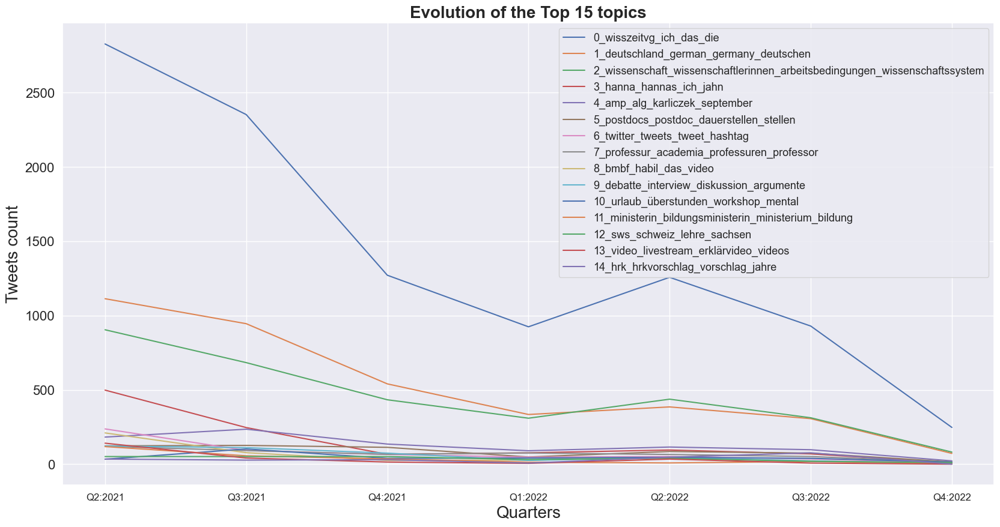

In [49]:
%matplotlib inline
sns.set(style="darkgrid")
fig = plt.figure(figsize = (20, 10))
legend = []
j = 1
for top in q_top[1:16]:
  plt.plot(quarter_labels, top)
  legend.append(topic_list[j])
  j+=1

plt.legend(legend, fontsize=13) 
# plt.legend([f'group{j+1},{names[r+2]}' for r,j in enumerate(new_hash_set[2:7]) ], fontsize=20) 
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 16)

plt.xlabel("Quarters",fontsize = 20)
plt.ylabel("Tweets count",fontsize = 20)
plt.title("Evolution of the Top 15 topics",fontsize = 20,fontweight='bold')
plt.show()

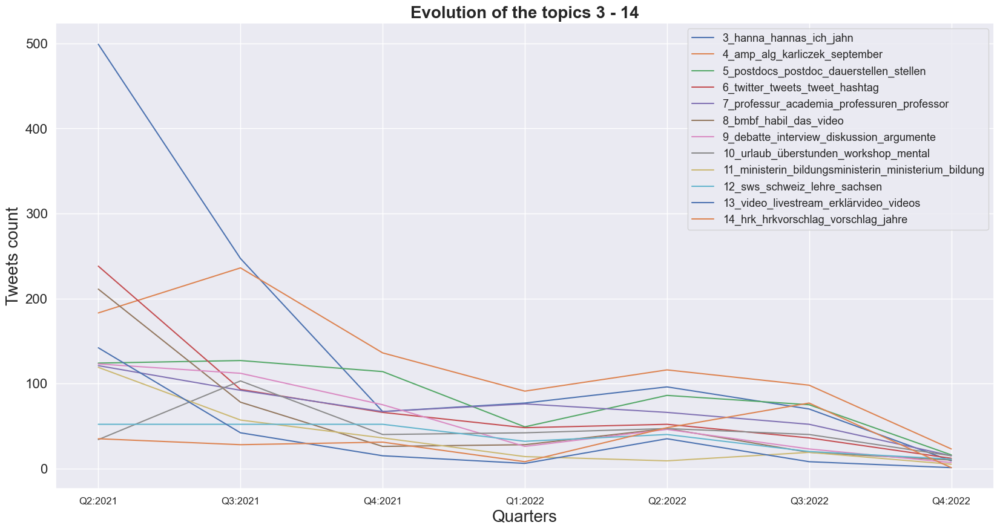

In [50]:
%matplotlib inline
sns.set(style="darkgrid")
fig = plt.figure(figsize = (20, 10))
legend = []
j = 4
for top in q_top[4:16]:
  plt.plot(quarter_labels, top)
  legend.append(topic_list[j])
  j+=1

plt.legend(legend, fontsize=13) 
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 16)

plt.xlabel("Quarters",fontsize = 20)
plt.ylabel("Tweets count",fontsize = 20)
plt.title("Evolution of the topics 3 - 14",fontsize = 20,fontweight='bold')
plt.show()